In [1]:
import os
import shutil
import cv2
import random
import matplotlib.pyplot as plt
import numpy as np
import copy

#madnessoooo1stop


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:

len(os.listdir('/content/drive/MyDrive/yolov9/data/rhino')), len(os.listdir('/content/drive/MyDrive/yolov9/data/elephant')), len(os.listdir('/content/drive/MyDrive/yolov9/data/buffalo')), len(os.listdir('/content/drive/MyDrive/yolov9/data/zebra'))

(752, 752, 752, 752)

In [4]:
ip_datapath='/content/drive/MyDrive/yolov9/data'
os.listdir(ip_datapath)

['rhino', 'elephant', 'buffalo', 'zebra']

In [5]:
# Defining standard image size for YOLO v8
image_size=640

In [6]:
from google.colab import drive
import os

# Mount Google Drive
drive.mount('/content/drive')

# Change directory to a specific folder in Google Drive
os.chdir('/content/drive/My Drive/yolov9')

# Verify the current working directory
print("Current working directory:", os.getcwd())


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Current working directory: /content/drive/.shortcut-targets-by-id/1z-UJtIwxmOqKl-zH13RE5Q5en9LpSIw4/yolov9


In [7]:
# Creating paths for separate images and labels
curr_path = os.getcwd()
imgtrainpath = os.path.join(curr_path, 'images', 'train')
imgvalpath = os.path.join(curr_path, 'images', 'validation')
imgtestpath = os.path.join(curr_path, 'images', 'test')

labeltrainpath = os.path.join(curr_path, 'labels', 'train')
labelvalpath = os.path.join(curr_path, 'labels', 'validation')
labeltestpath = os.path.join(curr_path, 'labels', 'test')

# Function to create directories if they do not exist
def create_dir(path):
    if not os.path.exists(path):
        os.makedirs(path)
    else:
        print(f"Directory {path} already exists, skipping creation.")

# Creating directories for all paths defined
create_dir(imgtrainpath)
create_dir(imgvalpath)
create_dir(imgtestpath)
create_dir(labeltrainpath)
create_dir(labelvalpath)
create_dir(labeltestpath)


In [8]:
for dirname in os.listdir(ip_datapath):
    dirpath=os.path.join(ip_datapath, dirname)
    for file in os.listdir(dirpath):
        filepath=os.path.join(dirpath, file)
        newname=dirname+'_'+file
        if file.endswith((".txt")): # if label file, take it to label train path
            shutil.copy(filepath, labeltrainpath)
            path=os.path.join(labeltrainpath, file)
            newpath=os.path.join(labeltrainpath, newname)
        elif file.endswith((".jpg", ".JPG")): # if image file, resize and take it to image train path
            img_resized=cv2.resize(cv2.imread(filepath), (image_size, image_size))
            path=os.path.join(imgtrainpath, file)
            cv2.imwrite(path, img_resized)
            newpath=os.path.join(imgtrainpath, newname)
        os.rename(path, newpath) # Rename the file (label or image)


In [9]:
# Checking the number of image and label files for all classes
len(os.listdir(imgtrainpath)), len(os.listdir(labeltrainpath))

(1504, 1504)

In [10]:
# function to check if all elements in the list are actually the same
def are_all_elements_same(lst):
    if not lst:
        return True  # An empty list is considered to have all elements the same.

    first_element = lst[0]
    for element in lst[1:]:
        if element != first_element:
            return False

    return True

In [11]:
for file in os.listdir(labeltrainpath):
    classes_list=[]
    with open(os.path.join(labeltrainpath, file), "r") as f:
        for line in f:
            class_id,_,_,_,_=line.strip().split(" ")
            classes_list.append(class_id) # creating list of all unique animal types in given image

    # Checking if different types of animals are present in image
    if not are_all_elements_same(classes_list):
        filepath=os.path.join(labeltrainpath, file)
        newpath=os.path.join(labeltestpath, file)
        shutil.move(filepath, newpath) # moving label file to test path
        basename=os.path.splitext(file)[0]
        print(basename) # printing the image name
        imgfilename=basename+'.jpg'
        oldimgfilepath=os.path.join(imgtrainpath, imgfilename)
        newimgfilepath=os.path.join(imgtestpath, imgfilename)
        shutil.move(oldimgfilepath, newimgfilepath) # moving image to test path

rhino_238
rhino_256
rhino_375
elephant_166
elephant_288
elephant_290
elephant_291
elephant_345
buffalo_273
buffalo_291
buffalo_299
buffalo_300
buffalo_298
buffalo_297
buffalo_301
zebra_073
zebra_338
zebra_339


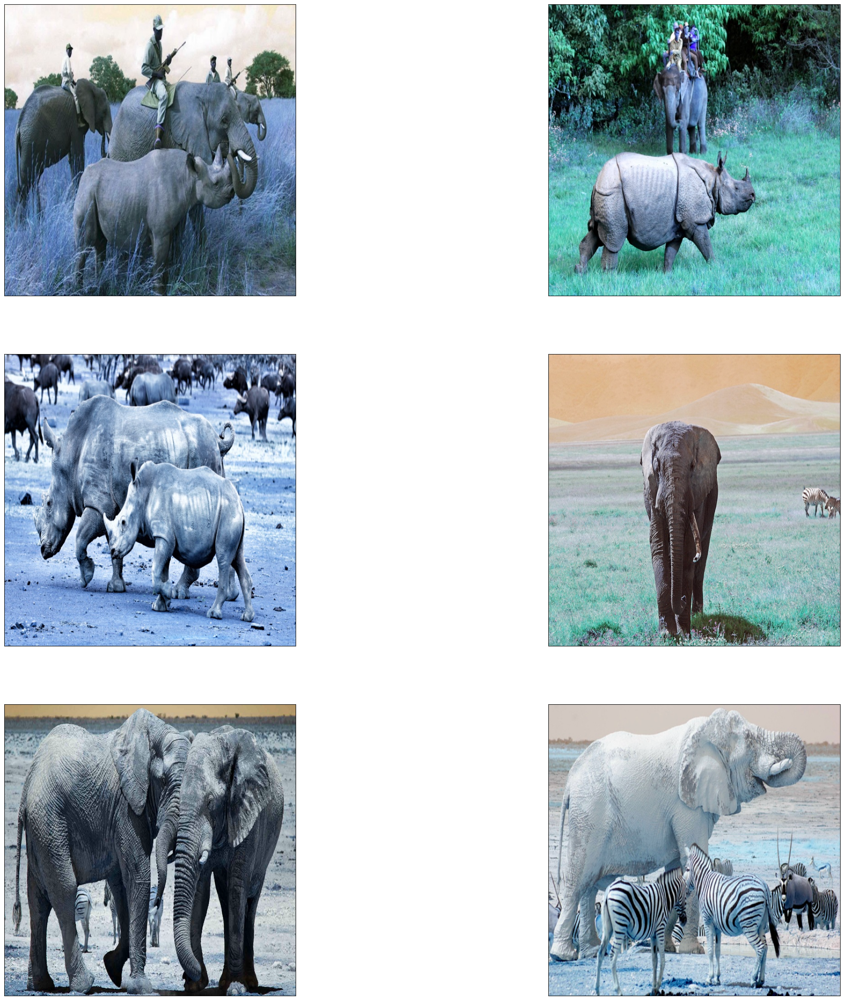

In [12]:
# Let's check few of these images
plt.figure(figsize=(30,30))
for i in range(6):
    test_image=os.path.join(imgtestpath, os.listdir(imgtestpath)[i])
    ax=plt.subplot(3,2,i+1)

    # Display actual image
    plt.imshow(cv2.imread(test_image))
    plt.xticks([])
    plt.yticks([])

In [13]:
# Checking the size of test dataset
len(os.listdir(imgtestpath)), len(os.listdir(labeltestpath))


(18, 18)

In [14]:
# Checking the size of training(+validation) dataset
len(os.listdir(imgtrainpath)), len(os.listdir(labeltrainpath))

(1486, 1486)

In [15]:
#Separating training and validation dataset
#Let's now partition the training dataset into training and validation dataset

# moving 20% of data to validation

factor=0.2

for file in random.sample(os.listdir(imgtrainpath), int(len(os.listdir(imgtrainpath))*factor)):
    basename=os.path.splitext(file)[0]
    textfilename=basename+'.txt'
    labelfilepath=os.path.join(labeltrainpath, textfilename)
    labeldestpath=os.path.join(labelvalpath, textfilename)
    imgfilepath=os.path.join(imgtrainpath, file)
    imgdestpath=os.path.join(imgvalpath, file)
    shutil.move(imgfilepath, imgdestpath)
    shutil.move(labelfilepath, labeldestpath)

In [16]:
# Checking the size of training dataset
len(os.listdir(imgtrainpath)), len(os.listdir(labeltrainpath))

(1189, 1189)

In [17]:
# Checking the size of validation dataset
len(os.listdir(imgvalpath)), len(os.listdir(labelvalpath))

(297, 297)

In [18]:
#Image visualisation with bounding box¶
#It's time to write a function to obtain bounding box coordinates of the images from the label files The label files contain information about image type, image centre coordinates and image size.

# function to obtain bounding box coordinates from text label files
def get_bbox_from_label(text_file_path):
    bbox_list=[]
    with open(text_file_path, "r") as file:
        for line in file:
            class_id,x_centre,y_centre,width,height=line.strip().split(" ")
            x1=(float(x_centre)+(float(width)/2))*image_size
            x0=(float(x_centre)-(float(width)/2))*image_size
            y1=(float(y_centre)+(float(height)/2))*image_size
            y0=(float(y_centre)-(float(height)/2))*image_size

            vertices=np.array([[int(x0), int(y0)], [int(x1), int(y0)],
                               [int(x1),int(y1)], [int(x0),int(y1)]])
            bbox_list.append(vertices)
    return tuple(bbox_list)

In [19]:
# defining red color in RGB to draw bounding box
red=(255,0,0)

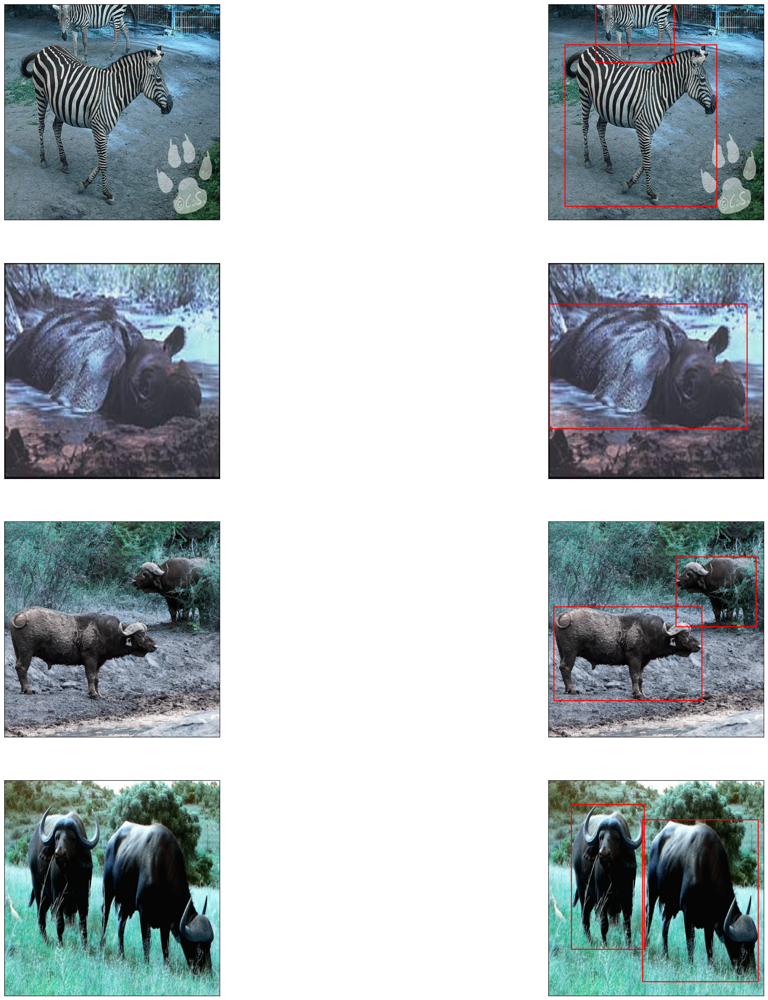

In [20]:
# Drawing bounding box for random images in training data
plt.figure(figsize=(30,30))
for i in range(1,8,2):
    k=random.randint(0, len(os.listdir(imgtrainpath))-1)
    img_path=os.path.join(imgtrainpath, sorted(os.listdir(imgtrainpath))[k])
    label_path=os.path.join(labeltrainpath, sorted(os.listdir(labeltrainpath))[k])
    bbox=get_bbox_from_label(label_path) # extracting bounding box coordinates
    image=cv2.imread(img_path)
    image_copy=copy.deepcopy(image)
    ax=plt.subplot(4, 2, i)
    plt.imshow(image) # displaying image
    plt.xticks([])
    plt.yticks([])
    cv2.drawContours(image_copy, bbox, -1, red, 2) # drawing bounding box on copy of image
    ax=plt.subplot(4, 2, i+1)
    plt.imshow(image_copy) # displaying image with bounding box
    plt.xticks([])
    plt.yticks([])

In [21]:
# defining newline variable for config file
newline='\n'

# Starting with a comment in config file
ln_1='# Train/val/test sets'+newline

# train, val and test path declaration
ln_2='train: ' +"'"+imgtrainpath+"'"+newline
ln_3='val: ' +"'" + imgvalpath+"'"+newline
ln_4='test: ' +"'" + imgtestpath+"'"+newline
ln_5='nc: 4'+newline
ln_6='# Classes'+newline

# names of the classes declaration
ln_7='names:'+newline
ln_8='  0: buffalo'+newline
ln_9='  1: elephant'+newline
ln_10='  2: rhino'+newline
ln_11='  3: zebra'

config_lines=[ln_1, ln_2, ln_3, ln_4, ln_5, ln_6, ln_7, ln_8, ln_9, ln_10, ln_11]

# Creating path for config file
config_path=os.path.join(curr_path, 'config.yaml')
print(f'{config_path}')

# Writing config file
with open(config_path, 'w') as f:
    f.writelines(config_lines)

/content/drive/.shortcut-targets-by-id/1z-UJtIwxmOqKl-zH13RE5Q5en9LpSIw4/yolov9/config.yaml


In [22]:
!git clone --recursive https://github.com/WongKinYiu/yolov9.git
%cd yolov9
!pip install -r requirements.txt -q

Cloning into 'yolov9'...
remote: Enumerating objects: 668, done.
remote: Counting objects: 100% (294/294), done.
remote: Compressing objects: 100% (93/93), done.
remote: Total 668 (delta 224), reused 201 (delta 201), pack-reused 374
Receiving objects: 100% (668/668), 3.22 MiB | 11.79 MiB/s, done.
Resolving deltas: 100% (269/269), done.
/content/drive/.shortcut-targets-by-id/1z-UJtIwxmOqKl-zH13RE5Q5en9LpSIw4/yolov9/yolov9
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.3/207.3 kB 5.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 4.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 12.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.3/21.3 MB 61.3 MB/s eta 0:00:00


In [23]:
!pip install supervision # to visualize and compare results ith annotations

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 111.0/111.0 kB 3.8 MB/s eta 0:00:00


In [24]:
!mkdir -p {HOME}/weights
!wget -P {HOME}/weights -q https://github.com/WongKinYiu/yolov9/releases/download/v0.1/yolov9-c.pt
!wget -P {HOME}/weights -q https://github.com/WongKinYiu/yolov9/releases/download/v0.1/yolov9-e.pt
!wget -P {HOME}/weights -q https://github.com/WongKinYiu/yolov9/releases/download/v0.1/gelan-c.pt
!wget -P {HOME}/weights -q https://github.com/WongKinYiu/yolov9/releases/download/v0.1/gelan-e.pt

In [25]:
!pwd

/content/drive/.shortcut-targets-by-id/1z-UJtIwxmOqKl-zH13RE5Q5en9LpSIw4/yolov9/yolov9


In [26]:
!python train.py \
--batch 8 \
--epochs 50 \
--device 0 \
--img 640 \
--min-items 0 \
--close-mosaic 15 \
--data /content/drive/MyDrive/yolov9/config.yaml \
--weights /content/drive/MyDrive/yolov9/yolov9/{HOME}/weights/gelan-c.pt \
--cfg /content/drive/MyDrive/yolov9/yolov9/models/detect/gelan-c.yaml \
--hyp hyp.scratch-high.yaml \
--project /content/drive/MyDrive/training \
--name sgdx \
--patience 300 \
--save-period 5



2024-05-22 11:52:21.600451: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-05-22 11:52:21.600508: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-05-22 11:52:21.724480: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-05-22 11:52:21.995895: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-05-22 11:52:26.004374: W tensorflow/compiler/tf2

In [27]:
%cd /content/drive/.shortcut-targets-by-id/1z-UJtIwxmOqKl-zH13RE5Q5en9LpSIw4/yolov9/yolov9

/content/drive/.shortcut-targets-by-id/1z-UJtIwxmOqKl-zH13RE5Q5en9LpSIw4/yolov9/yolov9


In [29]:
!python detect.py \
--img 640 --conf 0.5 --device 0 \
--weights /content/drive/MyDrive/training/sgdx/weights/best.pt \
--source /content/drive/MyDrive/yolov9/images/test

detect: weights=['/content/drive/MyDrive/training/sgdx/weights/best.pt'], source=/content/drive/MyDrive/yolov9/images/test, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.5, iou_thres=0.45, max_det=1000, device=0, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLO 🚀 v0.1-89-g93f1a28 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
gelan-c summary: 387 layers, 25230172 parameters, 0 gradients, 101.8 GFLOPs
image 1/18 /content/drive/.shortcut-targets-by-id/1z-UJtIwxmOqKl-zH13RE5Q5en9LpSIw4/yolov9/images/test/buffalo_273.jpg: 640x640 4 buffalos, 2 zebras, 50.2ms
image 2/18 /content/drive/.shortcut-targets-by-id/1z-UJtIwxmOqKl-zH13RE5Q5en9LpSIw4/yolov9/images/test/buffalo_291.jpg: 640x640 1 buffalo, 3 zeb

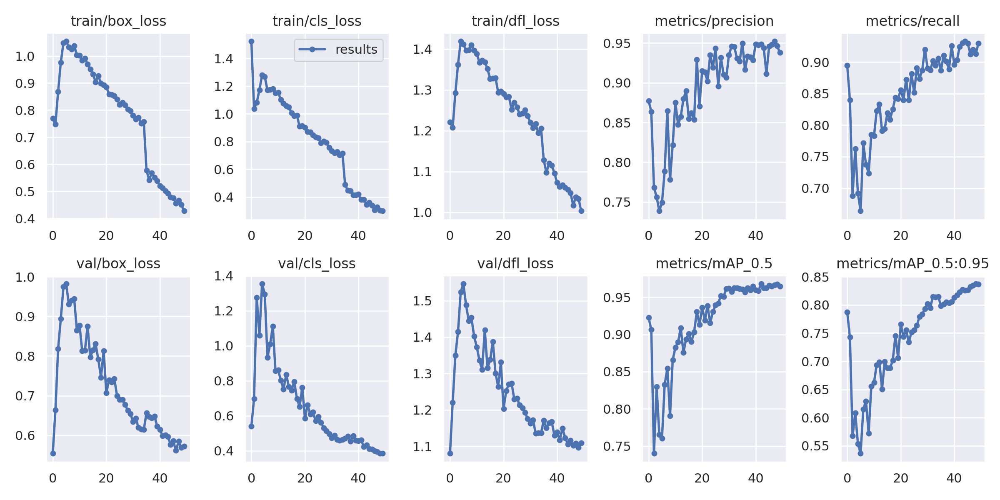

In [31]:
from PIL import Image

HISTORY_PATH = "/content/drive/MyDrive/training/sgdx/results.png"
training_history = Image.open(HISTORY_PATH)
training_history

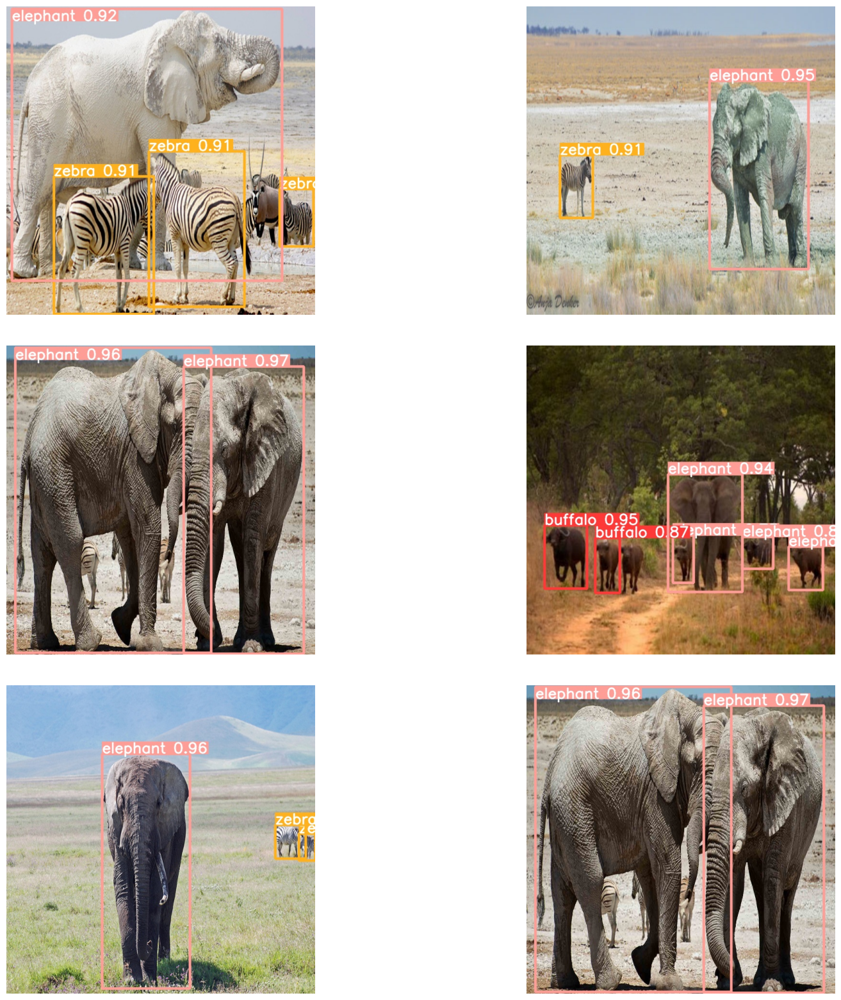

In [7]:
import os
import random
import matplotlib.pyplot as plt
from PIL import Image

def show_random_results(imgtestpath):
    # Get the list of files in the test image directory
    img_files = os.listdir(imgtestpath)

    # Ensure there are files in the directory
    if len(img_files) == 0:
        raise ValueError("No files found in the test image directory")

    # Select random image numbers from the available images in the test dataset
    random_images = [os.path.join(imgtestpath, img_files[random.randint(0, len(img_files) - 1)]) for _ in range(6)]

    # Plotting the images
    fig, axes = plt.subplots(3, 2, figsize=(20, 20))
    plt.subplots_adjust(wspace=0.1, hspace=0.1)

    for i, ax in enumerate(axes.flat):
        img = Image.open(random_images[i])
        ax.axis('off')
        ax.imshow(img)

    plt.show()

# Assuming imgtestpath is already defined
imgtestpath = '/content/drive/MyDrive/yolov9/yolov9/runs/detect/exp2'

# Call the function to show random results
show_random_results(imgtestpath)


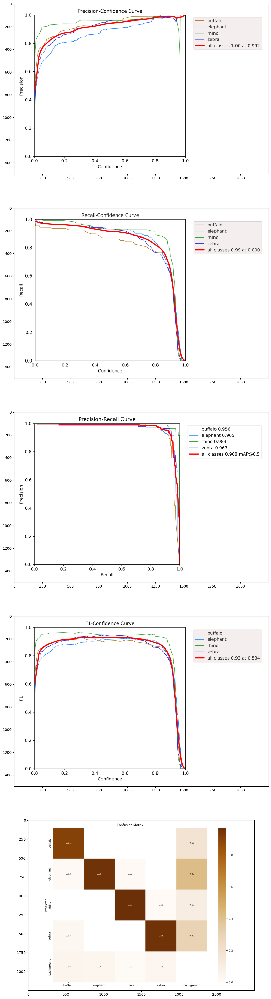

In [14]:

# function for displaying plots created by YOLO
def display_curves(root_path):
    plt.figure(figsize=(50,50))

    #displaying p curve
    p_curve=cv2.imread(os.path.join(root_path,'P_curve.png'))
    ax=plt.subplot(5,1,1)
    plt.imshow(p_curve)

    #displaying r curve
    r_curve=cv2.imread(os.path.join(root_path,'R_curve.png'))
    ax=plt.subplot(5,1,2)
    plt.imshow(r_curve)

    #displaying pr curve
    pr_curve=cv2.imread(os.path.join(root_path,'PR_curve.png'))
    ax=plt.subplot(5,1,3)
    plt.imshow(pr_curve)

    #displaying f1 curve
    f1_curve=cv2.imread(os.path.join(root_path,'F1_curve.png'))
    ax=plt.subplot(5,1,4)
    plt.imshow(f1_curve)
    #displaying confusion matrix
    confusion_matrix=cv2.imread(os.path.join(root_path,'confusion_matrix.png'))
    ax=plt.subplot(5,1,5)
    plt.imshow(confusion_matrix)


display_curves('/content/drive/MyDrive/training/sgdx')